In [1]:
import os
os.sys.path.append("C:\\Users\mplitt\MightyMorphingPhotonRangers")
import utilities as u
import single_session_plots as ssp
import numpy as np
import scipy as sp
import sklearn as sk
from matplotlib import pyplot as plt
from LatentVarFuncs import *

%matplotlib inline

%load_ext autoreload
%autoreload 2

C:\Users\mplitt\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# import behavioral sessions
mouse = '4139190.1'
df = u.load_session_db()
#ca1mice = ['4139190.1','4139190.3', '4054011.1','4139202.2']
#dgmice = ['4054010.4','4054010.5']


df = df[df['RewardCount']>10]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime'])

df_mouse = df[df['MouseName'].str.match(mouse)]
df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse = df_mouse.sort_values(['DateTime'])
df_mouse


,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,DateTime,data file,scanfile,scanmat
150,4139190.1,16_06_2018,2,TwoTower_Timeout,19,1,2018-06-16,G:\My Drive\\VR_Data\TwoTower\4139190.1\16_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\16_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\16_06_2...
210,4139190.1,19_06_2018,2,TwoTower_Timeout,75,1,2018-06-19,G:\My Drive\\VR_Data\TwoTower\4139190.1\19_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\19_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\19_06_2...
175,4139190.1,21_06_2018,3,TwoTower_Timeout,92,1,2018-06-21,G:\My Drive\\VR_Data\TwoTower\4139190.1\21_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\21_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\21_06_2...
177,4139190.1,21_06_2018,2,TwoTower_Timeout,20,1,2018-06-21,G:\My Drive\\VR_Data\TwoTower\4139190.1\21_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\21_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\21_06_2...
169,4139190.1,24_06_2018,2,TwoTower_Timeout,104,1,2018-06-24,G:\My Drive\\VR_Data\TwoTower\4139190.1\24_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2...
173,4139190.1,25_06_2018,2,TwoTower_Timeout,62,1,2018-06-25,G:\My Drive\\VR_Data\TwoTower\4139190.1\25_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\25_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\25_06_2...
205,4139190.1,27_06_2018,2,TwoTower_Timeout,81,1,2018-06-27,G:\My Drive\\VR_Data\TwoTower\4139190.1\27_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\27_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\27_06_2...
160,4139190.1,28_06_2018,8,TwoTower_Timeout,22,1,2018-06-28,G:\My Drive\\VR_Data\TwoTower\4139190.1\28_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...
164,4139190.1,28_06_2018,2,TwoTower_Timeout,17,1,2018-06-28,G:\My Drive\\VR_Data\TwoTower\4139190.1\28_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...
165,4139190.1,28_06_2018,9,TwoTower_Timeout,18,1,2018-06-28,G:\My Drive\\VR_Data\TwoTower\4139190.1\28_06_...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...,G:\My Drive\2P_Data\TwoTower\4139190.1\28_06_2...


In [3]:
# pick candidate session
sess = df_mouse.iloc[4]
sess

MouseName                                                4139190.1
DateFolder                                              24_06_2018
SessionNumber                                                    2
Track                                             TwoTower_Timeout
RewardCount                                                    104
Imaging                                                          1
DateTime                                       2018-06-24 00:00:00
data file        G:\My Drive\\VR_Data\TwoTower\4139190.1\24_06_...
scanfile         G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2...
scanmat          G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2...
Name: 169, dtype: object

G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2018\TwoTower_Timeout\TwoTower_Timeout_2_000.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:276: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\mplitt\Anaconda3\lib\site-packages\numpy\core\_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:479: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_m

G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2018\TwoTower_Timeout\TwoTower_Timeout_2_000.mat
#subsystem#not made into numpy array


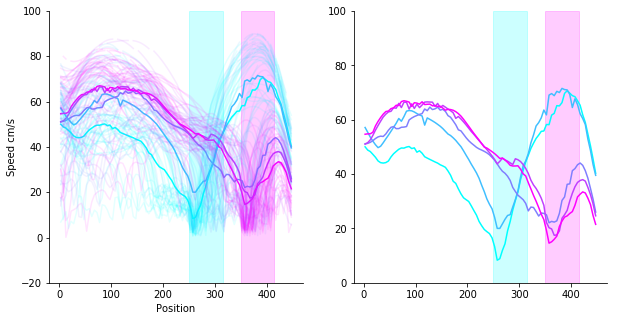

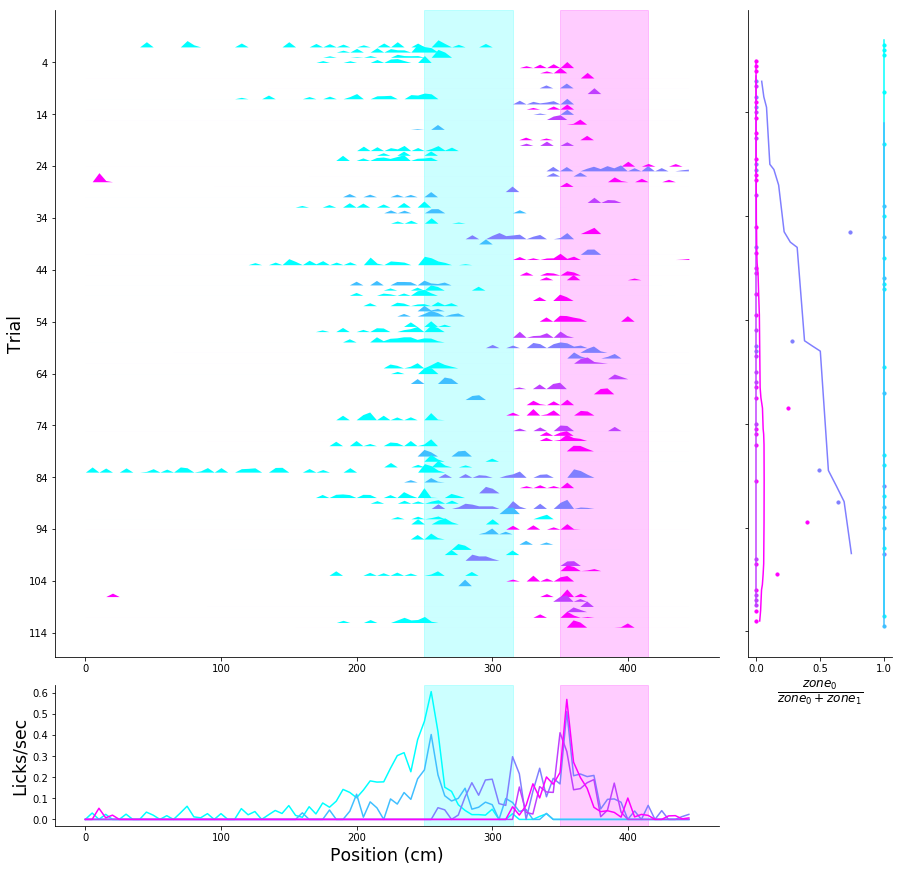

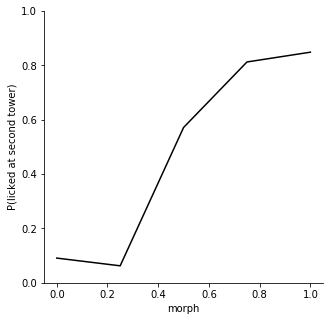

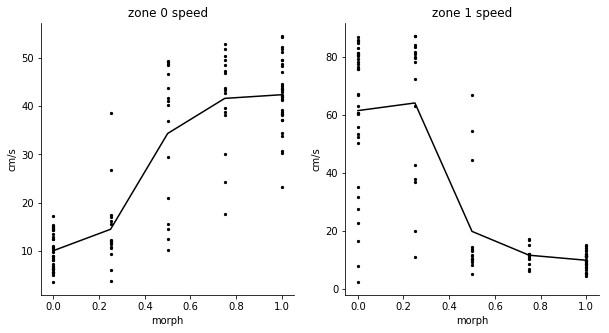

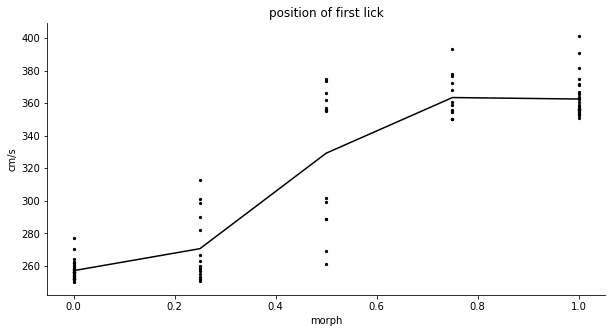

In [4]:
# get behavior and imaging data
behav = u.behavior_dataframe(sess['data file'],sess['scanmat'],concat=False)
tmp = ssp.run_behavior(behav,ratio = True)

info = u.loadmat_sbx(sess['scanmat'])['info']
ca_dat = u.load_ca_mat(sess['scanfile'])

C = ca_dat['C_keep'][info['frame'][0]:info['frame'][-1]+1]

frame_diff = behav.shape[0]-C.shape[0]
if frame_diff>0:
    behav = behav.iloc[:-frame_diff]
    
    
C_z = sp.stats.zscore(C,axis=0)

# z-score fluorescence signal

In [5]:
# make cubic splines
def make_spline_basis(x,knots=np.arange(0,450,100)):
    '''make cubic spline basis functions'''
    knotfunc = lambda k: np.power(np.multiply(x-k,(x-k)>0),3)
    spline_basis_list = [knotfunc(k) for k in knots.tolist()]
    spline_basis_list += [np.ones(x.shape[0]),x,np.power(x,2)]
    return np.array(spline_basis_list).T



def pos_morph_design_matrix(x,m,splines=True,knots=np.arange(-50,450,50)):
    '''make design matrix for GLM that uses basis functions for position and separate regresssors for each context'''
    if splines:
        basis = make_spline_basis(x,knots=knots)
    else:
        # add functionality for radial basis functions
        pass
    
    M = np.matlib.repmat(m[np.newaxis].T,1,basis.shape[1])
    
    dmat = np.hstack((basis,np.multiply(M,basis)))
    return dmat


dmat = pos_morph_design_matrix(behav['pos']._values,behav['morph']._values)

In [6]:
#  
train_inds = ((behav['morph']==1) | (behav['morph']==0)) & (behav['pos']>0)
dmat_extreme = dmat[train_inds,:]
C_extreme = C_z[train_inds,:]

glm = sk.linear_model.LinearRegression()

# for cells in session
glm.fit(dmat_extreme,C_extreme)
mu_extreme_hat = glm.predict(dmat_extreme)





0.05298202177909202
(36959, 1637)


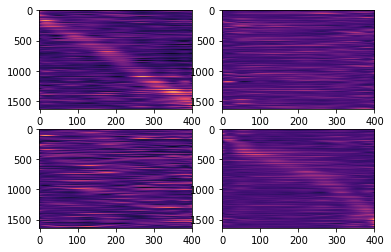

In [7]:
# check that you get place cell like things
print(glm.score(dmat_extreme,C_extreme))
print(C_z.shape)
f,ax = plt.subplots(2,2)
x = np.linspace(0,450,400)
basis0 = pos_morph_design_matrix(x,np.zeros([x.shape[0],]))
basis1 = pos_morph_design_matrix(x,np.ones([x.shape[0],]))
yhat0 = glm.predict(basis0)
yhat1 = glm.predict(basis1)

maxinds0,maxinds1 = np.argmax(yhat0,axis=0),np.argmax(yhat1,axis=0)
maxsort0,maxsort1 = np.argsort(maxinds0),np.argsort(maxinds1)
for i in range(0,C_z.shape[1],50):
    
    #for cell in range(yhat0.shape[1]):
    #    yhat0[:,cell] = yhat0[:,cell]/yhat0[:,cell].sum()
    #    yhat1[:,cell] = yhat1[:,cell]/yhat1[:,cell].sum()
    
    ax[0,0].imshow(yhat0[:,maxsort0].T,aspect='auto',cmap='magma')
    ax[0,1].imshow(yhat1[:,maxsort0].T,aspect='auto',cmap='magma')
    
    ax[1,0].imshow(yhat0[:,maxsort1].T,aspect='auto',cmap='magma')
    ax[1,1].imshow(yhat1[:,maxsort1].T,aspect='auto',cmap='magma')



In [8]:
# empirical probability density
# bin by position
# bin by intensity

# normalize across columns


# compare to standard place cell analysis


In [9]:
# check KS plots of subset

# check for density outside KS bounds

# Simple decoding 

- start with assuming that you are given position up to time $t$, $x_{1:t}$ and the activity of neuron $j$ up to time $t$, $y_{1:t}^j$<br\>

- First, assume timepoints are independent:

$$ P(I|x_t,y_t)    \propto P(y_t|I,x_t)P(I|x_t) \\
   \propto P(y_t|I,x_t) $$


In [10]:
# get likelihoods

def gaussian_pdf(x,mu,sigma):
    #x = x[np.newaxis].T
    return 1/(2.*np.pi)**.5 * np.divide(np.exp(-1.*np.divide(np.power(x-mu,2),2*np.power(sigma,2))),sigma)




In [11]:

# mean in case that all morphs are 0
pos = behav['pos']._values
mu_i0 = glm.predict(pos_morph_design_matrix(pos,np.zeros([pos.shape[0],])))


# likelihood
l_i0 = gaussian_pdf(C_z,mu_i0,1) 


# mean in case that all morphs are 1
mu_i1 = glm.predict(pos_morph_design_matrix(pos,np.ones([pos.shape[0],])))

# likelihood
l_i1 = gaussian_pdf(C_z,mu_i1,1)

# calculate posterior
# P(I=1|x_t,y_t) = P(y_t|I=1,x_t)/(P(y_t|I=1,x_t) + P(y_t|I=0,x_t))
#zeros = np.where((l_i0==0)&(l_i1==0))
post = np.divide(l_i1,l_i0+l_i1)
#post[zeros]=.5


# get start and stop indices
tstarts,tstops = np.where(behav['tstart']==1)[0],np.where(behav['teleport']==1)[0]
# for each trial get posterior for each cell at each time point
trial_posterior, trial_pos = [], []

for start,stop in zip(tstarts,tstops):
    trial_posterior.append(post[start:stop,:])
    trial_pos.append(pos[start:stop-1])
    

d = u.by_trial_info(behav)
print(d.keys())
mask = (d['morphs']==0) | (d['morphs']==1)
#for key in d.keys():
#    d[key] = d[key][mask]

C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:479: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


dict_keys(['morphs', 'max_pos', 'rewards', 'zone0_licks', 'zone1_licks', 'zone0_speed', 'zone1_speed', 'pcnt', 'wallJitter', 'towerJitter', 'bckgndJitter', 'clickOn', 'pos_lick'])


In [12]:
print(trial_posterior[30].shape)

(170, 1637)


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


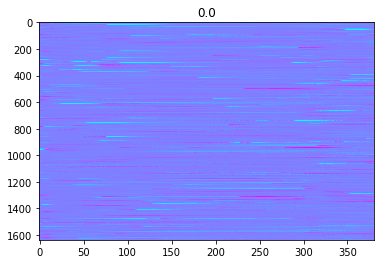

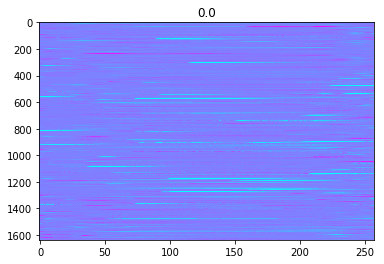

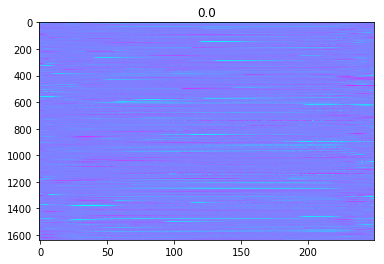

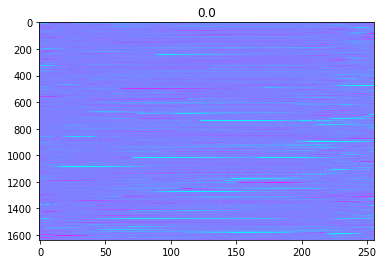

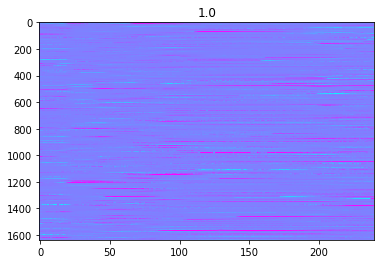

...

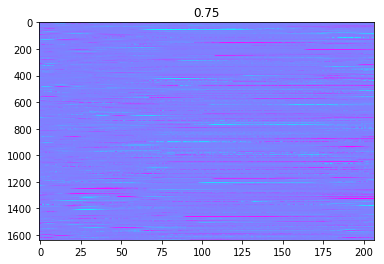

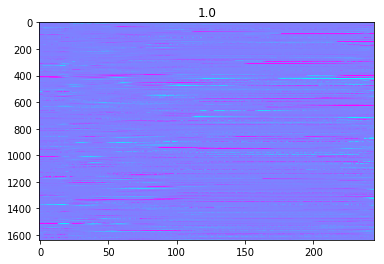

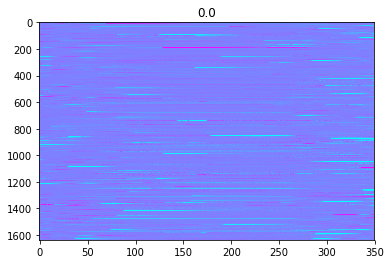

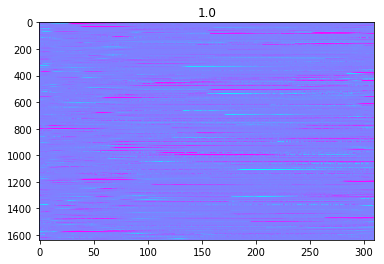

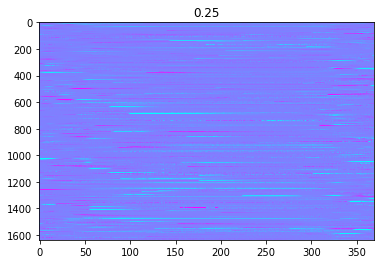

In [13]:
# sanity check plots
# plot single cells on subset of trials
for i, (tmppost, tmppos,m) in enumerate(zip(trial_posterior,trial_pos,d['morphs'])):
    #if m>0 and m<1:
    f,ax = plt.subplots()
    ax.imshow(tmppost.T,aspect='auto',cmap='cool',vmin=0,vmax=1)
    ax.set_title(m)
    #pass
 



C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


(36959, 1637)


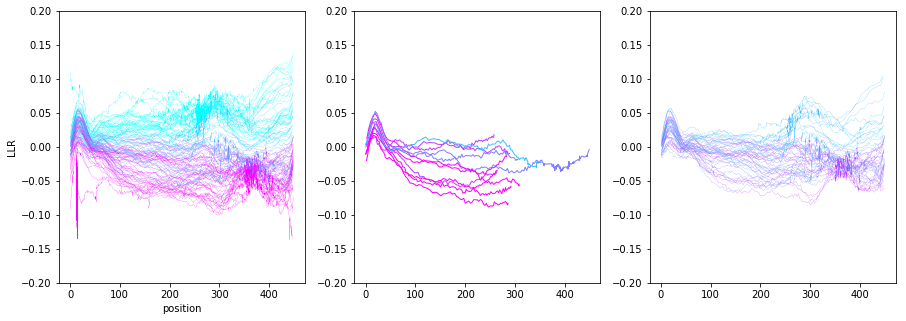

In [14]:
# log likelihood ratios for whole population 
post_pop = np.divide(np.sum(np.log(l_i1),axis=1),np.sum(np.log(l_i0),axis=1))
trial_posterior, trial_pos = [], []
print(post.shape)

for start,stop in zip(tstarts,tstops):
    trial_posterior.append(post_pop[start:stop])
    trial_pos.append(pos[start:stop])
    
f,ax = plt.subplots(1,3,figsize=[15,5])
for i, (tmppost, tmppos,m,r) in enumerate(zip(trial_posterior,trial_pos,d['morphs'],d['rewards'])):
    #if m>0 and m<1:
    
    if r==1 or (m>0 and m<1):
        ax[0].plot(tmppos,np.log(tmppost),color=plt.cm.cool(m),linewidth=.2,alpha=1)
        ax[0].set_ylim([-.2,.2])
        ax[0].set_ylabel('LLR')
        ax[0].set_xlabel('position')
    if r==0 :
        ax[1].plot(tmppos,np.log(tmppost),color=plt.cm.cool(m),linewidth=1,alpha=1)
        ax[1].set_ylim([-.2,.2])
    if m!=0 and m!=1:
        ax[2].plot(tmppos,np.log(tmppost),color=plt.cm.cool(m),linewidth=.2,alpha=1)
        ax[2].set_ylim([-.2,.2])
        

### Assume accumulation of evidence

- Problem is to solve for $P(I|x_{1:t},y^j_{1:t})$





In [15]:
# set initial conditions
post_t0 = .5

# get likelihood, position, and morph for each trial
#trial_pos  already set
trial_l0, trial_l1 = [], []
for (start,stop) in zip(tstarts,tstops):
    trial_l0.append(l_i0[start:stop,:])
    trial_l1.append(l_i1[start:stop,:])
    
# Chapman-Kolmogorov update
trial_ll0,trial_ll1,trial_llr=[],[],[]
for i, (start,stop) in enumerate(zip(tstarts,tstops)):
    tmp_post1 = [np.log(.5*np.ones([trial_l1[i].shape[1],]))]
    tmp_post0 = [np.log(.5*np.ones([trial_l0[i].shape[1],]))]
    for j in range(trial_l1[i].shape[0]):
        #print(trial_l1[i].shape)
        tmp_post1.append(np.log(trial_l1[i][j,:])+tmp_post1[j])
        tmp_post0.append(np.log(trial_l0[i][j,:])+tmp_post0[j])
    trial_ll1.append(np.squeeze(np.array(tmp_post1)))
    trial_ll0.append(np.squeeze(np.array(tmp_post0)))
    trial_llr.append(np.divide(trial_ll1[i],trial_ll0[i]))


C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


In [16]:
#f, ax = plt.subplots()
for i, (tmpllr, tmppos,m) in enumerate(zip(trial_llr,trial_pos,d['morphs'])):
    #ax.plot(tmppos,tmppost[1:,2],color=plt.cm.cool(m))
    #if m>0 and m<1:
    #f,ax = plt.subplots()
    #ax.imshow(tmpllr.T,aspect='auto',cmap='cool',vmin=.5,vmax=2)
    #ax.set_title(m)
    pass
        

In [17]:
print(trial_ll0[0].shape)

(382, 1637)


C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


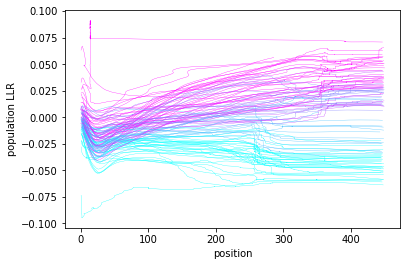

In [18]:
# plot population log-likelihood ratio
trial_pop_llr = []
for trial in range(len(trial_llr)):
    trial_pop_llr.append(np.divide(trial_ll0[trial][1:,:].sum(axis=1),trial_ll1[trial][1:,:].sum(axis=1)))
    
f,ax = plt.subplots()
for i, (tmpllr, tmppos,m) in enumerate(zip(trial_pop_llr,trial_pos,d['morphs'])):
    ax.plot(tmppos,np.log(tmpllr),color=plt.cm.cool(m),linewidth=.3,alpha=1)
    ax.set_ylabel('population LLR')
    ax.set_xlabel('position')

### Assume cell can only integrate for fixed window of time (e.g. 3 s)
- reset posterior to .5 every $n$ timepoints

# Simultaneous place and context decoding

$$ P(I,x_t|y_{1:t}) \propto P(y_t|x_t,I) \int dx_{t-1} P(x_t|x_{t-1}) P(x_t, I | y_{1:t-1}) \\
P(I|y_{1:t}) = \int dx_t P(I,x_t|y_{1:t}) \\
$$

In [19]:
# get position transition probabilities

# bin positions in 10 cm
bin_edges = [0]
for i in range(5,460,5):
    bin_edges.append(i)
pos_binned1 = np.digitize(pos[behav['morph']==1],bin_edges,right=True)
pos_binned0 = np.digitize(pos[behav['morph']==0],bin_edges,right=True)

#transition matrix
p_xx_i1 = np.zeros([len(bin_edges),len(bin_edges)])
p_xx_i0 = np.zeros([len(bin_edges),len(bin_edges)])

for b in np.unique(pos_binned1).tolist():
    inds = np.where(pos_binned1==b)[0]
    xx = pos_binned1[(inds+1)%pos_binned1.shape[0]]
    next_inds = np.unique(xx)
    bcount = np.bincount(xx)
    bcount = bcount[bcount>0]
    
    p_xx_i1[b,next_inds] = bcount/bcount.sum()
    # for each bin
        # prob that next time point is in each bin
        
for b in np.unique(pos_binned0).tolist():
    inds = np.where(pos_binned0==b)[0]
    xx = pos_binned0[(inds+1)%pos_binned0.shape[0]]
    next_inds = np.unique(xx)
    bcount = np.bincount(xx)
    bcount = bcount[bcount>0]
    
    p_xx_i0[b,next_inds] = bcount/bcount.sum()
        
pos_binned = np.digitize(pos,bin_edges,right=True)


In [20]:
# run decoder
post_i0x_y, post_i1x_y= [],[]
post_i0 ,post_i1 = [],[]
dx = 5
for i, (start,stop) in enumerate(zip(tstarts,tstops)):
    if i%5==0:
        print(i)
    
    trial_pos_bin = pos_binned[start:stop]
    post_trial0, post_trial1 = [],[]
    for j in range(trial_l1[i].shape[0]):
        if j==0: # if first timepoint, set initial conditions
            
            # set probability of being in current position to 1
            onehot = np.zeros([p_xx_i0.shape[1],1])
            onehot[0] = 1.
            
            # multiply by likelihood and prior on being in context
            tmp0 = .5*np.dot(onehot,trial_l0[i][j,:][np.newaxis])
            tmp1 = .5*np.dot(onehot,trial_l1[i][j,:][np.newaxis])
            
            # normalization factor
            tmp_denom = tmp0.sum(axis=0)+tmp1.sum(axis=0)
            tmp_denom = np.dot(np.ones([p_xx_i0.shape[0],1]),tmp_denom[np.newaxis])

            # posterior having observed 1 time frame
            tmppost1 = np.divide(tmp1,tmp_denom)
            tmppost0 = np.divide(tmp0,tmp_denom)


        else:
            # calculate integrand - transition matrix x posterior at previous timepoint
            b1 = np.dot(p_xx_i1.T,tmppost1)
            b0 = np.dot(p_xx_i0.T,tmppost0)

            # numerator of new posterior
            tmpnum0 = np.multiply(b0,np.matlib.repmat(trial_l0[i][j,:],p_xx_i0.shape[0],1))
            tmpnum1= np.multiply(b1,np.matlib.repmat(trial_l1[i][j,:],p_xx_i1.shape[0],1))
            
            # normalization factor for updated posterior
            tmp_denom = tmpnum0.sum(axis=0)+tmpnum1.sum(axis=0)
            tmp_denom = np.dot(np.ones([p_xx_i0.shape[0],1]),tmp_denom[np.newaxis])
            
            # new posterior
            tmppost1 = np.divide(tmpnum1,tmp_denom)
            tmppost0 = np.divide(tmpnum0,tmp_denom)
            
            # add to list for trial
            post_trial0.append(tmppost0)
            post_trial1.append(tmppost1)
    
    # append trials posterior to list
    post_i0x_y.append(np.array(post_trial0))
    post_i1x_y.append(np.array(post_trial1))
    # sum across positions to get posterior of context
    post_i1.append(np.squeeze(np.array(post_trial1).sum(axis=1)))
    post_i0.append(np.squeeze(np.array(post_trial0).sum(axis=1)))

0
5
10
15
20
25
30
35
40
45


C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


50
55
60
65
70
75
80
85
90
95
100
105
110


In [ ]:
# plot decoded position vs real position 
# heatmap of posterior with real trajectory plotted on top

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


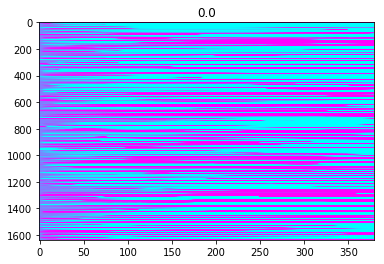

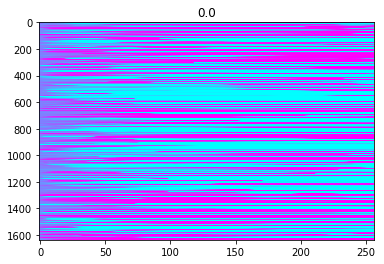

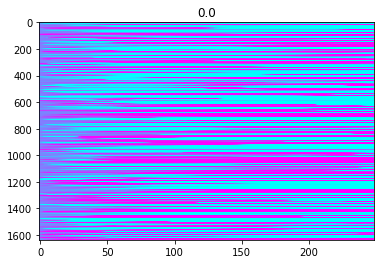

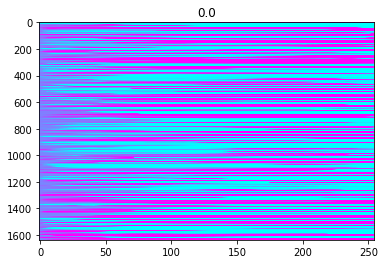

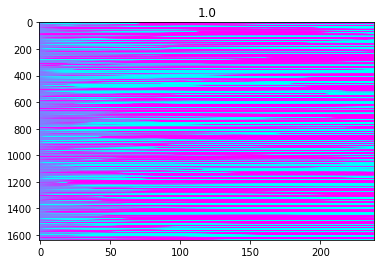

...

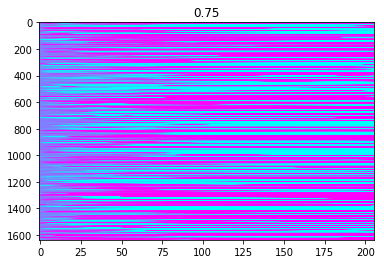

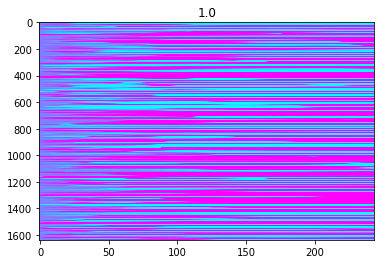

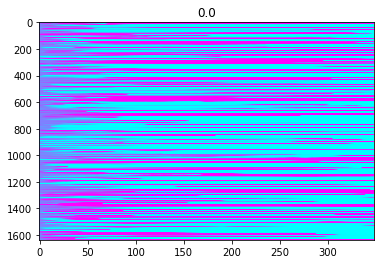

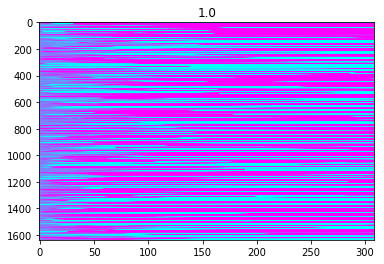

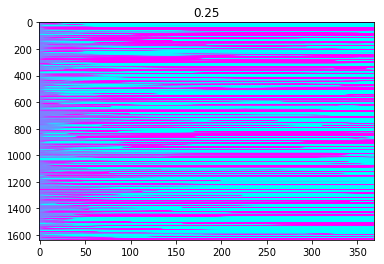

In [21]:
for i, (tmppost, tmppos,m) in enumerate(zip(post_i1,trial_pos,d['morphs'])):
    #if m>0 and m<1:
    f,ax = plt.subplots()
    ax.imshow(tmppost.T,aspect='auto',cmap='cool',vmin=0,vmax=1)
    ax.set_title(m)
    #pass


In [22]:
post_pop_lr = []
for tmp0, tmp1 in zip(post_i0,post_i1):
    logpost0 = np.log(tmp0).sum(axis=1)
    logpost1 = np.log(tmp1).sum(axis=1)
    lr = np.divide(logpost0,logpost1)
    lr[np.isinf(lr)]=50.
    post_pop_lr.append(np.divide(logpost0,logpost1))
    

C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.
C:\Users\mplitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


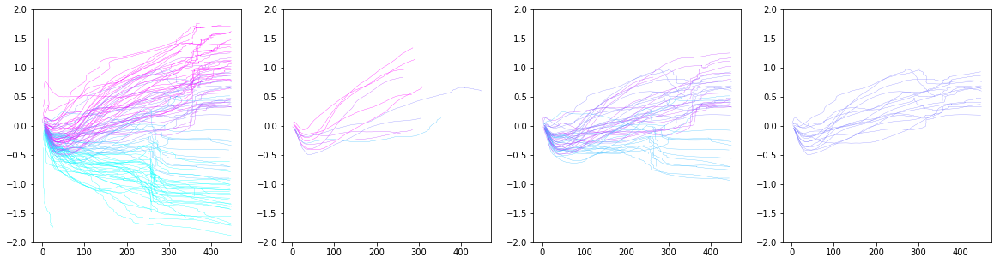

In [23]:
f,ax = plt.subplots(1,4,figsize=[20,5])
for (lr,pos,m,r)  in zip(post_pop_lr,trial_pos,d['morphs'],d['rewards']):
    if r>0:
        ax[0].plot(pos[1:],np.log(lr),color=plt.cm.cool(m),linewidth=.3)
        ax[0].set_ylim([-2,2])
    if r<1:
        ax[1].plot(pos[1:],np.log(lr),color=plt.cm.cool(m),linewidth=.3)
        ax[1].set_ylim([-2,2])
    if m>0 and m<1:
        ax[2].plot(pos[1:],np.log(lr),color=plt.cm.cool(m),linewidth=.3)
        ax[2].set_ylim([-2,2])
    if m==.5:
        ax[3].plot(pos[1:],np.log(lr),color=plt.cm.cool(m),linewidth=.3)
        ax[3].set_ylim([-2,2])